<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Notebook-description" data-toc-modified-id="Notebook-description-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Notebook description</a></span></li><li><span><a href="#Imports" data-toc-modified-id="Imports-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Global-variables" data-toc-modified-id="Global-variables-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Global variables</a></span></li><li><span><a href="#Helpers-functions" data-toc-modified-id="Helpers-functions-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Helpers functions</a></span></li><li><span><a href="#Data-visualization" data-toc-modified-id="Data-visualization-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Data visualization</a></span></li><li><span><a href="#Risk-neutral-BO-aka-GP-UCB" data-toc-modified-id="Risk-neutral-BO-aka-GP-UCB-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Risk-neutral BO aka GP-UCB</a></span><ul class="toc-item"><li><span><a href="#Model" data-toc-modified-id="Model-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Model</a></span></li><li><span><a href="#Acquision-function:-ucb" data-toc-modified-id="Acquision-function:-ucb-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Acquision function: ucb</a></span></li><li><span><a href="#Optimization-loop" data-toc-modified-id="Optimization-loop-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Optimization loop</a></span></li><li><span><a href="#Animation" data-toc-modified-id="Animation-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>Animation</a></span></li></ul></li><li><span><a href="#Risk-averse-BO-aka-RAHBO" data-toc-modified-id="Risk-averse-BO-aka-RAHBO-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Risk-averse BO aka RAHBO</a></span><ul class="toc-item"><li><span><a href="#Model" data-toc-modified-id="Model-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Model</a></span></li><li><span><a href="#Acquisition-function" data-toc-modified-id="Acquisition-function-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Acquisition function</a></span></li><li><span><a href="#Optimization-loop" data-toc-modified-id="Optimization-loop-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span>Optimization loop</a></span></li><li><span><a href="#Animation" data-toc-modified-id="Animation-7.4"><span class="toc-item-num">7.4&nbsp;&nbsp;</span>Animation</a></span></li></ul></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></div>

### Notebook description
$\text{This notebook provides an illustrative example of Risk-averse-Heteroscedastic-BO (RAHBO) applied to sine}$
$\text{function that has two global optima with different noise level. In a nutshel, RAHBO trades mean and }$
$\text{input-dependent variance of the objective, both of which we assume to be unknown a priori and modeled by}$ $\text{Gaussian Processes (GPs). The acquision function used in RAHBO relies on Upper-Confidence Bound (UCB),}$
$\text{a standard widely-used risk-neutral algorithm that optimizes the unknown}$ $f(x)$. $\text{In this notebook, we use}$ 
$\text{UCB with heteroscedastic GP as an illustrative baseline that we compare RAHBO with. }$


$\text{We cover more baselines in other experiments.} $

### Imports

In [1]:
import torch

import gpytorch
from gpytorch.mlls import ExactMarginalLogLikelihood 
from gpytorch.likelihoods import FixedNoiseGaussianLikelihood
from gpytorch.kernels.matern_kernel import MaternKernel

from botorch.models import SingleTaskGP, FixedNoiseGP
from botorch.fit import fit_gpytorch_model
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf

import numpy as np
import tqdm

%load_ext autoreload
%autoreload 2

import helper_fns
from helper_fns.plotting_utils import plot_objectives, plot_objectives_mean_std, plot_hist_f_rho, plot_f_rho
from helper_fns.reporting_rules_postprocess import transform_x_to_tensor, report_idx_max_ymean, report_idx_max_mv, \
    report_idx_max_last_lcb_rahbo, report_idx_max_last_lcb_rahbous, report_idx_max_last_lcb_ucb

In [2]:
# Plotting settings

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.rcParams["animation.html"] = "jshtml"
from matplotlib import animation
from IPython.display import display, HTML
import seaborn as sns
sns.set_style("whitegrid")

plt.rcParams['figure.figsize'] = [18, 8]
plt.rcParams['font.size'] = 16
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'

In [3]:
# RAHBO imports

import rahbo
from rahbo.test_functions.sine import SineBenchmark
from rahbo.optimization.bo_step import bo_step, bo_step_risk_averse, bo_step_adaptive_risk_averse
from rahbo.acquisition.acquisition import RiskAverseUpperConfidenceBound, LowerConfidenceBound

### Global variables

$\text{Variable that define the experimental setup (description in the comments)}$

In [ ]:
GLOBAL_VARS = {
    'gamma': 1, # risk-tolerance constant for rahbo (corresponds to \alpha in the RAHBO paper)
    'sigma': 1, # noise variance in the area with maximum noise
    'seed': 1,  # random seed for initial evaluations generation
    'n_budget': 30, # number of BO iterations
    'n_budget_var': 5, # number of BO iterations to be used for variance learning (relevant only for RAHBO-US)
    'repeat_eval': 10, # number of evaluations at the same point
    'beta': 2, # hyperparameter for UCB acquisition function
    'n_bo_restarts': 20, # number of BO restarts (used for experiments plots in the paper)
    'n_initial': 5, # number of initial points for BO (used to choose GP)
    'min_repeat_eval': 3
}

### Helpers functions

In [ ]:
def plot_bo_step(inputs, scores, gp, acquisition, beta, title=None, fig=None, axes=[], iteration=None):
    
    if fig is None:
        fig = plt.figure(figsize=(12, 4))
        
    gp.eval()
    gp.likelihood.eval()
    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        test_x_1 = torch.linspace(0, 1, 100).view(-1, 1)
        test_x = torch.cat([test_x_1, test_x_1+1])
        observed_pred = gp(test_x)

    posterior_mean = gp.posterior(test_x).mean
    posterior_var = gp.posterior(test_x).variance
    lower = posterior_mean - np.sqrt(beta*posterior_var)
    upper = posterior_mean + np.sqrt(beta*posterior_var)

    ymin = -2
    ymax = 3
    ax = fig.add_subplot(1, 1, 1, label=iteration)
    ax.plot(inputs.numpy(), scores.numpy(), 'o', color ='k', label='Observed Data')
    ax.plot(inputs[-1].numpy(), scores[-1].numpy(), 'o', color ='yellow', label='Acquired point')
    ax.plot(test_x.numpy(), observed_pred.mean.numpy(), 'b', label='Mean')
    ax.fill_between(test_x.numpy().reshape((len(test_x),)), 
                    lower.numpy().reshape((-1,)), 
                    upper.numpy().reshape((-1,)), 
                    alpha=0.5,
                    label='Confidence')
    ax.plot(test_x.numpy(), acquisition.forward(test_x.reshape((-1,1,1))).numpy(), color='g', label='Acquisition function')
    max_ucb = acquisition.forward(test_x.reshape((-1,1,1))).detach().numpy().max()
    argmax_ucb = acquisition.forward(test_x.reshape((-1,1,1))).detach().numpy().argmax()
    ax.plot(test_x.numpy()[argmax_ucb], 
            max_ucb, 
            'o', 
            color='g', 
            label='Acquisition max')
    ax.vlines(x=1, ymin=ymin, ymax=ymax, colors ='r', label='Noise domain separation')
    ax.set_ylim([ymin, ymax])
    ax.legend(ncol=3, loc='upper center', bbox_to_anchor=(0.5, 1.1))
    ax.set_title(title)
    axes.append([ax])
    
    return fig, axes

In [ ]:
def plot_sine(nmb_points=10):
    
    sine = SineBenchmark(GLOBAL_VARS)
    
    x = sine.get_random_initial_points(num_points=nmb_points, seed=GLOBAL_VARS['seed'])
    x = x.sort(dim=0)[0] # sort for plotting
    x_expanded = x.expand(-1, GLOBAL_VARS['repeat_eval'])
    
    y_true = sine.f(x)
    y = sine.evaluate(x)
    yvar_true = sine.get_noise_var(x)
    yvar = y.var(dim=1)

    _, axes = plt.subplots(2, 1, figsize=(8, 8))
    color = cm.Dark2(np.linspace(0,1,8))

    axes[0].plot(x, y_true, 'r', linewidth=3, color=color[1], label = 'True')
    axes[0].plot(x_expanded.reshape((-1,1)), y.reshape((-1,1)), 
                'o', markersize = 3, color=color[0], label='Noisy evaluations')

    axes[0].set_ylim([-2, 4])
    axes[0].set_ylabel(r'$f\ (x)$')
    axes[0].set_xlabel(r'$x$')
    axes[0].legend(ncol=2, loc='upper center', framealpha=0.9)

    axes[1].plot(x, yvar, 'o', markersize = 6, color=color[2], label='Sample variance')
    axes[1].plot(x, yvar_true, linewidth=3, color=color[4], label='True variance')
    axes[1].legend(loc='upper left', framealpha=0.2)
    axes[1].set_ylabel(r'$\rho\ (x)$')
    axes[1].set_xlabel(r'$x$')
    
    return axes

### Data visualization

We visualise the objective (true and repeated noise evaluations) and the noise variance (true and estimated for the epeated noise evaluations). The sine function in the top plot has two global optimizers, i.e. $0.25$ and $1.25$. We control the evaluation noise such that for each input, there is a choice between a low and a high noise version. We use a sigmoid function as noise variance, as depicted in the plot below that induces little noise on $[0,1]$ and increased noise on $(1,2]$. We initialize the algorithms by selecting 10 inputs $x$ at random, and keep these points the same for all algorithms. We use $k = 10$ samples at each chosen $x_t$.  The number of acquisition rounds is $T = 60$. We repeat the experiment 30 times and show the average performance in  \cref{fig:sine_res}. 

/home/tueilsy-st01/anaconda3/envs/benchmark/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r" (-> color=(1.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  app.launch_new_instance()


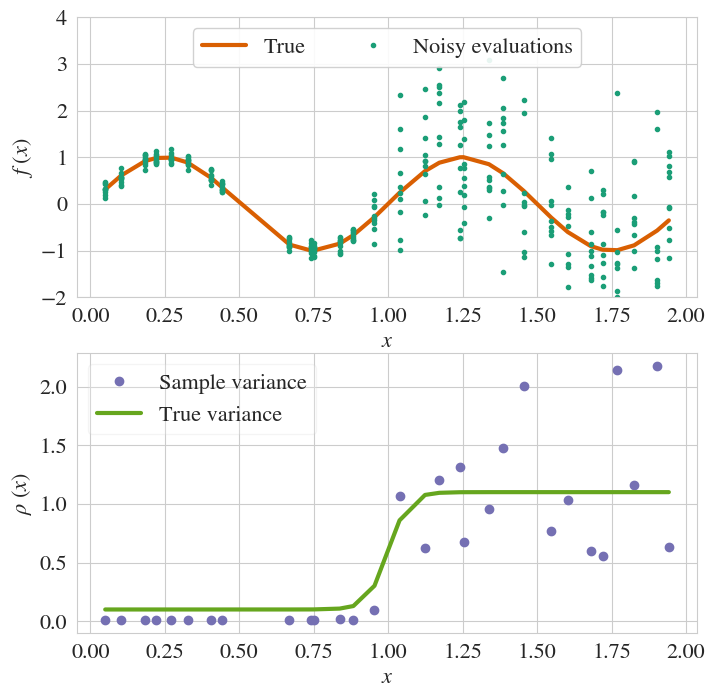

In [ ]:
axes = plot_sine(nmb_points=30)

### Risk-neutral BO aka GP-UCB


We first explicitly define each building block of BO, i.e., data sampling, gp model, acquisition function and chack how they work. We then wrap them in the optimization loop.  

In [ ]:
# We first define the objective 

sine = SineBenchmark(GLOBAL_VARS)
    
x = sine.get_random_initial_points(num_points=GLOBAL_VARS['n_initial'], seed=GLOBAL_VARS['seed'])
y = sine.evaluate(x)
yvar = y.var(dim=1, keepdim=True)
ymean = y.mean(dim=1, keepdim=True)
yvar_true = sine.get_noise_var(x)

#### Model



In [ ]:
# Here we use a GP where the noise is assumed to be heteroscedastic (FixedNoiseGP). 
# To this end, we provide evaluations of variance yvar in addition to the pair (x, ymean)
# We use default Matern 5/2 kernel, but it's easy to provide standard gpytorch kernels as follows:
# gp_model = FixedNoiseGP(x, ymean, yvar, covar_module=gpytorch.kernels.MaternKernel(nu=3/2)).to(x)

gp_model = FixedNoiseGP(x, ymean, yvar).to(x)
mll = ExactMarginalLogLikelihood(gp_model.likelihood, gp_model)
fit_gpytorch_model(mll)

# Get into evaluation (predictive posterior) mode
gp_model.eval()
gp_model.likelihood.eval()

# Test points are regularly spaced along [0,2]
# Make predictions by feeding model through likelihood
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    test_x_1 = torch.linspace(0, 1, 100).view(-1, 1)
    test_x = torch.cat([test_x_1, test_x_1+1])
    yvar_true_test = sine.get_noise_var(test_x)
    observed_pred = gp_model(test_x)

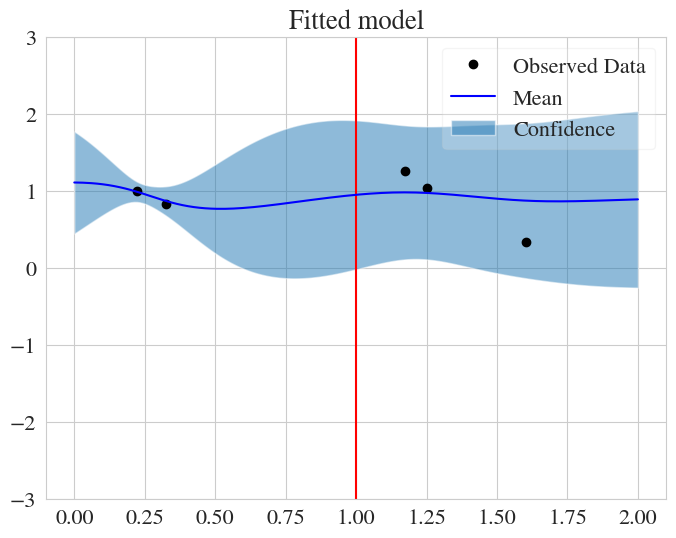

In [ ]:
# Visualization of the fitted model

with torch.no_grad():
    # Initialize plot
    f, ax = plt.subplots(1, 1, figsize=(8, 6))
    ymin = -3
    ymax = 3

    # Get upper and lower confidence bounds
    lower, upper = observed_pred.confidence_region()
    # Plot training data as black stars
    ax.plot(x.numpy(), ymean.numpy(), 'o', color ='k', label='Observed Data')
    ax.vlines(x=1, ymin=ymin, ymax=ymax, colors ='r', )
    # Plot predictive means as blue line
    ax.plot(test_x.numpy(), observed_pred.mean.numpy(), 'b', label='Mean')
    # Shade between the lower and upper confidence bounds
    ax.fill_between(test_x.numpy().reshape((len(test_x),)), lower.numpy(), upper.numpy(), alpha=0.5, label='Confidence')
    ax.set_ylim([ymin, ymax])
    ax.set_title('Fitted model')
    ax.legend(loc='best', framealpha=0.2)

#### Acquision function: ucb

Here we define UCB acquisition function, domain and get an x candidate as the results of the optimization of acq funciton. 

In [ ]:
# Acquisition function
ucb = UpperConfidenceBound(gp_model, beta=GLOBAL_VARS['beta'])

# Domain over which the acq function is optimized
bounds = sine.get_domain()

candidate, acq_value = optimize_acqf(
    ucb, bounds=bounds, q=1, num_restarts=GLOBAL_VARS['n_bo_restarts'], raw_samples=20,
)

candidate

tensor([[2.]])

#### Optimization loop

This block just unifies sampling data, model and acquision function from the above into iterative BO loop. 
The BO loop is the restarted to collect reliable results.

In [ ]:

sine = SineBenchmark(GLOBAL_VARS)
objective = sine.evaluate
bounds = sine.get_domain()


inputs_all_ucb = []
results_all_ucb = []
animations_ucb = []

for restart in range(GLOBAL_VARS['n_bo_restarts']):

    axes = []
    fig = None
    
    results = {}
    idxs = []
    
    x = sine.get_random_initial_points(num_points=GLOBAL_VARS['n_initial'], seed=GLOBAL_VARS['seed'] + restart)
    y = objective(x)
    yvar = y.var(dim=1, keepdim=True)
    ymean = y.mean(dim=1, keepdim=True)
    yvar_true = sine.get_noise_var(x)
    
    inputs = x
    input_queries = torch.tensor([[input_x.item()] * GLOBAL_VARS['repeat_eval'] for input_x in inputs]).reshape(-1, 1)
    scores = ymean
    scores_var = yvar
    state_dict = None

    best_observed = []
    best_observed.append(scores.max())
    
    total_iters = GLOBAL_VARS['n_budget']
    with tqdm.tqdm(total=total_iters) as bar:
        for iteration in range(1, total_iters + 1):

            n_samples = len(scores)

            GP = FixedNoiseGP
            acquisition = lambda gp: UpperConfidenceBound(gp, beta=GLOBAL_VARS['beta'])


            inputs, scores, gp, scores_var, input_queries, eval_times = bo_step(inputs, scores, input_queries, objective, bounds,
                                                                                GP=GP, acquisition=acquisition, q=1,
                                                                                state_dict=state_dict, input_query=True,
                                                                                train_Yvar = scores_var)
            lcb_function = LowerConfidenceBound(gp, GLOBAL_VARS['beta'], maximize=False)
            # means = lcb_function.forward(test_x.reshape((len(test_x), 1, -1)), posterior_mean=True)                                                                
            # idxs.extend([int(means.argmax())] * eval_times)
            lcbs = lcb_function.forward(test_x.reshape((len(test_x), 1, -1)))                                                                
            idxs.extend([int(lcbs.argmax())] * eval_times)
            
            state_dict = gp.state_dict()
            best_observed.append(scores.max())
            bar.update(len(scores) - n_samples)

            with torch.no_grad():
                fig, axes = plot_bo_step(inputs, scores, gp, acquisition(gp), beta=GLOBAL_VARS['beta'], 
                                         fig=fig, axes=axes, iteration=iteration) 
   
    animations_ucb.append(animation.ArtistAnimation(fig, artists=axes, interval=10000/24))
    plt.close() 
    
    inputs_all_ucb.append(inputs)
    results['inputs'] = inputs
    results['input_queries'] = input_queries
    results['reporting'] = test_x[idxs]
    results['scores'] = scores
    results['scores_var'] = scores_var
    results['scores_best'] = best_observed
    results_all_ucb.append(results)

/home/tueilsy-st01/anaconda3/envs/benchmark/lib/python3.7/site-packages/matplotlib/animation.py:888: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you have outputted the Animation using `plt.show()` or `anim.save()`.
  'Animation was deleted without rendering anything. This is '
  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:04<00:00,  5.26it/s]


#### Animation

In [ ]:
# We visualizae the acuquision for a particular seed = 0 
animations_ucb[0]

In [ ]:
# from IPython.core.display import HTML

# # We visualizae the acuquision for all seeds
# for a in animations_ucb:
#     display(HTML(a.to_html5_video()))

### Risk-averse BO aka RAHBO

In [ ]:
sine = SineBenchmark(GLOBAL_VARS)
    
x = sine.get_random_initial_points(num_points=GLOBAL_VARS['n_initial'], seed=GLOBAL_VARS['seed'])
y = sine.evaluate(x)
yvar = y.var(dim=1, keepdim=True)
ymean = y.mean(dim=1, keepdim=True)
yvar_true = sine.get_noise_var(x)

#### Model

We model both the sine function and the noise variance

In [ ]:
# Variance model

# Here we use a standard GP with homoscedastic noise (SingleTaskGP) where default Matern kernel is used
# You can choose GP with the kernels that fits best to your data

gp_model_varproxi = SingleTaskGP(x, yvar).to(x)
mll_varproxi = ExactMarginalLogLikelihood(gp_model_varproxi.likelihood, gp_model_varproxi)
fit_gpytorch_model(mll_varproxi)

ExactMarginalLogLikelihood(
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (noise_prior): GammaPrior()
      (raw_noise_constraint): GreaterThan(1.000E-04)
    )
  )
  (model): SingleTaskGP(
    (likelihood): GaussianLikelihood(
      (noise_covar): HomoskedasticNoise(
        (noise_prior): GammaPrior()
        (raw_noise_constraint): GreaterThan(1.000E-04)
      )
    )
    (mean_module): ConstantMean()
    (covar_module): ScaleKernel(
      (base_kernel): MaternKernel(
        (lengthscale_prior): GammaPrior()
        (raw_lengthscale_constraint): Positive()
        (distance_module): Distance()
      )
      (outputscale_prior): GammaPrior()
      (raw_outputscale_constraint): Positive()
    )
  )
)

In [ ]:
# Function model

gp_model = FixedNoiseGP(x, ymean, yvar).to(x)
mll = ExactMarginalLogLikelihood(gp_model.likelihood, gp_model)
fit_gpytorch_model(mll)

gp_model.eval()
gp_model.likelihood.eval()

with torch.no_grad(), gpytorch.settings.fast_pred_var():
    test_x_1 = torch.linspace(0, 1, 100).view(-1, 1)
    test_x = torch.cat([test_x_1, test_x_1+1])
    observed_pred = gp_model(test_x)

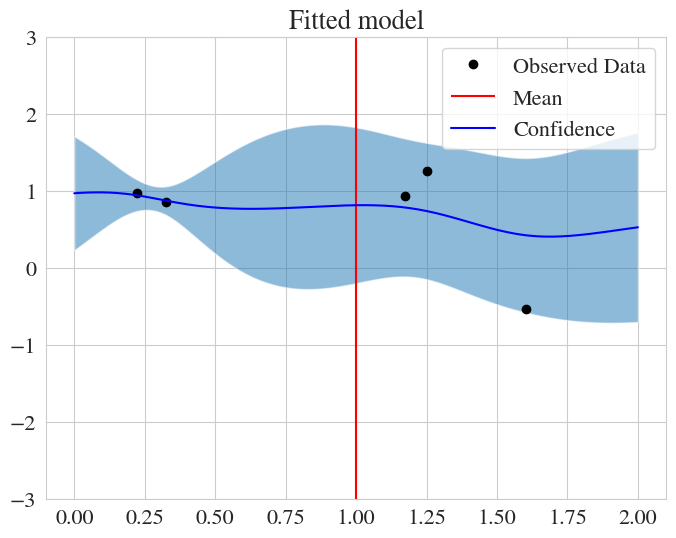

In [ ]:
with torch.no_grad():
    # Initialize plot
    f, ax = plt.subplots(1, 1, figsize=(8, 6))
    ymin = -3
    ymax = 3

    # Get upper and lower confidence bounds
    lower, upper = observed_pred.confidence_region()
    # Plot training data as black stars
    ax.plot(x.numpy(), ymean.numpy(), 'o', color ='k')
    ax.vlines(x=1, ymin=ymin, ymax=ymax, colors ='r')
    # Plot predictive means as blue line
    ax.plot(test_x.numpy(), observed_pred.mean.numpy(), 'b')
    # Shade between the lower and upper confidence bounds
    ax.fill_between(test_x.numpy().reshape((len(test_x),)), lower.numpy(), upper.numpy(), alpha=0.5)
    ax.set_ylim([ymin, ymax])
    ax.set_title('Fitted model')
    ax.legend(['Observed Data', 'Mean', 'Confidence'])

#### Acquisition function

In [ ]:
rahbo = RiskAverseUpperConfidenceBound(gp_model, gp_model_varproxi, 
                                        beta=GLOBAL_VARS['beta'], beta_varproxi=GLOBAL_VARS['beta'],
                                        gamma=GLOBAL_VARS['gamma'])

# Domain over which the acq function is optimized
bounds = sine.get_domain()

candidate, acq_value = optimize_acqf(
    rahbo, bounds=bounds, q=1, num_restarts=GLOBAL_VARS['n_bo_restarts'], raw_samples=20,
)

candidate

tensor([[0.]])

#### Optimization loop

In [ ]:
sine = SineBenchmark(GLOBAL_VARS)
objective = sine.evaluate
bounds = sine.get_domain()


inputs_all_rahbo = []
results_all_rahbo = []
animations_rahbo = []
last_plots = []

for restart in range(GLOBAL_VARS['n_bo_restarts']):

    axes = []
    fig = None
    
    results = {}
    idxs = []
    
    x = sine.get_random_initial_points(num_points=GLOBAL_VARS['n_initial'], seed=GLOBAL_VARS['seed'] + restart)
    y = objective(x)
    yvar = y.var(dim=1, keepdim=True)
    ymean = y.mean(dim=1, keepdim=True)
    yvar_true = sine.get_noise_var(x)
    
    inputs = x
    input_queries = torch.tensor([[input_x.item()] * GLOBAL_VARS['repeat_eval'] for input_x in inputs]).reshape(-1, 1)
    scores = ymean
    scores_var = yvar
    state_dict = None


    best_observed = []
    best_observed.append(scores.max())

    
    total_iters = GLOBAL_VARS['n_budget']
    with tqdm.tqdm(total=total_iters) as bar:
        for iteration in range(1, total_iters + 1):

            n_samples = len(scores)

            GP = FixedNoiseGP
            acquisition = lambda gp, gp_var: RiskAverseUpperConfidenceBound(gp, gp_var,
                                                                            beta=GLOBAL_VARS['beta'], 
                                                                            beta_varproxi=GLOBAL_VARS['beta'],
                                                                            gamma=GLOBAL_VARS['gamma']
                                                                            )

            inputs, scores, gp, scores_var, gp_var, input_queries, eval_times = bo_step_risk_averse(inputs, scores, input_queries, objective, bounds,
                                                                                        GP=GP, acquisition=acquisition, q=1,
                                                                                        state_dict=state_dict, input_query=True,
                                                                                        train_Yvar=scores_var)
            ralcb_function = RiskAverseUpperConfidenceBound(gp, gp_var, GLOBAL_VARS['beta'], GLOBAL_VARS['beta'], GLOBAL_VARS['gamma'], maximize=False)
            lcbs = ralcb_function.forward(test_x.reshape((len(test_x), 1, -1)))
            idxs.extend([int(lcbs.argmax())] * eval_times)
                    
            state_dict = gp.state_dict()
            best_observed.append(scores.max())
            bar.update(len(scores) - n_samples)
            
            with torch.no_grad():
                fig, axes = plot_bo_step(inputs, scores, gp, acquisition(gp, gp_var), beta=GLOBAL_VARS['beta'],
                                         title='RAHBO', fig=fig, axes=axes, iteration=iteration) 
    animations_rahbo.append(animation.ArtistAnimation(fig, artists=axes, interval=10000/24))
    plt.close() 
    
    inputs_all_rahbo.append(inputs)
    results['inputs'] = inputs
    results['input_queries'] = input_queries
    results['reporting'] = test_x[idxs]
    results['scores'] = scores
    results['scores_var'] = scores_var
    results['scores_best'] = best_observed
    results_all_rahbo.append(results)

/home/tueilsy-st01/anaconda3/envs/benchmark/lib/python3.7/site-packages/matplotlib/animation.py:888: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you have outputted the Animation using `plt.show()` or `anim.save()`.
  'Animation was deleted without rendering anything. This is '
  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:09<00:00,  2.00it/s]


#### Animation

In [ ]:
a = animations_rahbo[0]

for i in a.frame_seq:
    plt.show(i)

In [ ]:
animations_rahbo[0]

### Adaptive RAHBO

In [ ]:
sine = SineBenchmark(GLOBAL_VARS)
objective = sine.evaluate
bounds = sine.get_domain()


inputs_all_arahbo = []
results_all_arahbo = []
animations_arahbo = []
last_plots = []

for restart in range(GLOBAL_VARS['n_bo_restarts']):

    axes = []
    fig = None
    
    results = {}
    idxs = []
    
    x = sine.get_random_initial_points(num_points=GLOBAL_VARS['n_initial'], seed=GLOBAL_VARS['seed'] + restart)
    y = objective(x)
    yvar = y.var(dim=1, keepdim=True)
    ymean = y.mean(dim=1, keepdim=True)
    yvar_true = sine.get_noise_var(x)
    
    inputs = x
    input_queries = torch.tensor([[input_x.item()] * GLOBAL_VARS['repeat_eval'] for input_x in inputs]).reshape(-1, 1)
    scores = ymean
    scores_var = yvar
    state_dict = None


    best_observed = []
    best_observed.append(scores.max())
    current_best = 0
    
    total_iters = GLOBAL_VARS['n_budget']
    with tqdm.tqdm(total=total_iters) as bar:
        for iteration in range(1, total_iters + 1):

            n_samples = len(scores)

            GP = FixedNoiseGP
            acquisition = lambda gp, gp_var: RiskAverseUpperConfidenceBound(gp, gp_var,
                                                                            beta=GLOBAL_VARS['beta'], 
                                                                            beta_varproxi=GLOBAL_VARS['beta'],
                                                                            gamma=GLOBAL_VARS['gamma']
                                                                            )

            inputs, scores, gp, scores_var, gp_var, input_queries, eval_times = bo_step_adaptive_risk_averse(inputs, scores, input_queries, GLOBAL_VARS['gamma'], current_best, 
                                                                                                 GLOBAL_VARS['min_repeat_eval'], GLOBAL_VARS['repeat_eval'],
                                                                                                 (GLOBAL_VARS['n_initial']+GLOBAL_VARS['n_budget'])*GLOBAL_VARS['repeat_eval'],
                                                                                                 objective, bounds, GP=GP, acquisition=acquisition,
                                                                                                 q=1, state_dict=state_dict, input_query=True,
                                                                                                 train_Yvar=scores_var)
            ralcb_function = RiskAverseUpperConfidenceBound(gp, gp_var, GLOBAL_VARS['beta'], GLOBAL_VARS['beta'], GLOBAL_VARS['gamma'], maximize=False)
            lcbs = ralcb_function.forward(test_x.reshape((len(test_x), 1, -1)))
            idxs.extend([int(lcbs.argmax())] * eval_times)

            rule = ralcb_function.forward(test_x.reshape((len(test_x), 1, -1)), rule=True)
            
            if int(rule.max()) > current_best:
                current_best = int(rule.max())
            state_dict = gp.state_dict()
            best_observed.append(scores.max())
            bar.update(len(scores) - n_samples)
            
            with torch.no_grad():
                fig, axes = plot_bo_step(inputs, scores, gp, acquisition(gp, gp_var), beta=GLOBAL_VARS['beta'],
                                         title='ARAHBO', fig=fig, axes=axes, iteration=iteration) 
    animations_arahbo.append(animation.ArtistAnimation(fig, artists=axes, interval=10000/24))
    plt.close() 
    
    inputs_all_arahbo.append(inputs)
    results['inputs'] = inputs
    results['input_queries'] = input_queries
    results['reporting'] = test_x[idxs]
    results['scores'] = scores
    results['scores_var'] = scores_var
    results['scores_best'] = best_observed
    results_all_arahbo.append(results)

/home/tueilsy-st01/anaconda3/envs/benchmark/lib/python3.7/site-packages/matplotlib/animation.py:888: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you have outputted the Animation using `plt.show()` or `anim.save()`.
  'Animation was deleted without rendering anything. This is '
 10%|█         | 3/30 [00:00<00:05,  4.93it/s]

100%|██████████| 30/30 [00:11<00:00,  1.62it/s]


In [ ]:
animations_arahbo[0]

In [ ]:
# # We visualizae the acuquision for all seeds
# for a in animations_rahbo:
#     display(HTML(a.to_html5_video()))

In [ ]:
objectives = {}
score_array_ucb = sine.f(results_all_ucb[0]['reporting'])
for restart in range(1, len(results_all_ucb)):
    score_array_ucb = torch.cat([score_array_ucb, sine.f(results_all_ucb[restart]['reporting'])], dim=1)
score_array_ucb = sine._max_value - score_array_ucb

score_array_rahbo = sine.f(results_all_rahbo[0]['reporting'])
for restart in range(1, len(results_all_rahbo)):
    score_array_rahbo = torch.cat([score_array_rahbo, sine.f(results_all_rahbo[restart]['reporting'])], dim=1)
score_array_rahbo = sine._max_value - score_array_rahbo

min_shape = min([result['reporting'].shape[0] for result in results_all_arahbo])
score_array_arahbo = sine.f(results_all_arahbo[0]['reporting'][:min_shape])
for restart in range(1, len(results_all_arahbo)):
    score_array_arahbo = torch.cat([score_array_arahbo[:min_shape], sine.f(results_all_arahbo[restart]['reporting'][:min_shape])], dim=1)
score_array_arahbo = sine._max_value - score_array_arahbo

objectives['GP-UCB'] = score_array_ucb
objectives['RAHBO'] = score_array_rahbo
objectives['ARAHBO'] = score_array_arahbo

(<Figure size 600x600 with 1 Axes>,
 <AxesSubplot:xlabel='Evaluations', ylabel='f($x*$)-f($\\hat{x}_T$)'>)

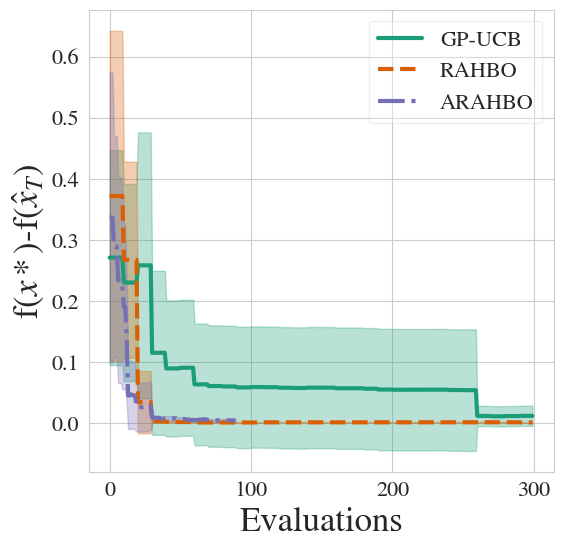

In [ ]:
plot_objectives_mean_std(objectives, objective_name='f($x*$)-f($\\hat{x}_T$)', x_label='Evaluations')

In [ ]:
objectives = {}
score_array_ucb = sine.f(results_all_ucb[0]['reporting']) - GLOBAL_VARS['gamma'] * sine.get_noise_var(results_all_ucb[0]['reporting'])
for restart in range(1, len(results_all_ucb)):
    score_array_ucb = torch.cat([score_array_ucb, 
                                 sine.f(results_all_ucb[restart]['reporting']) - GLOBAL_VARS['gamma'] * sine.get_noise_var(results_all_ucb[restart]['reporting'])],
                                 dim=1)
score_array_ucb = sine.f(torch.tensor(sine._optimizers[0])) - GLOBAL_VARS['gamma'] * sine.get_noise_var(torch.tensor(sine._optimizers[0])) - score_array_ucb

score_array_rahbo = sine.f(results_all_rahbo[0]['reporting']) - GLOBAL_VARS['gamma'] * sine.get_noise_var(results_all_rahbo[0]['reporting'])
for restart in range(1, len(results_all_rahbo)):
    score_array_rahbo = torch.cat([score_array_rahbo,
                                   sine.f(results_all_rahbo[restart]['reporting']) - GLOBAL_VARS['gamma'] * sine.get_noise_var(results_all_rahbo[restart]['reporting'])],
                                   dim=1)
score_array_rahbo = sine.f(torch.tensor(sine._optimizers[0])) - GLOBAL_VARS['gamma'] * sine.get_noise_var(torch.tensor(sine._optimizers[0])) - score_array_rahbo

score_array_arahbo = sine.f(results_all_arahbo[0]['reporting']) - GLOBAL_VARS['gamma'] * sine.get_noise_var(results_all_arahbo[0]['reporting'])
min_shape = min([result['reporting'].shape[0] for result in results_all_arahbo])
for restart in range(1, len(results_all_arahbo)):
    score_array_arahbo = torch.cat([score_array_arahbo[:min_shape],
                                   sine.f(results_all_arahbo[restart]['reporting'][:min_shape]) - GLOBAL_VARS['gamma'] * 
                                    sine.get_noise_var(results_all_arahbo[restart]['reporting'][:min_shape])],
                                   dim=1)
score_array_arahbo = sine.f(torch.tensor(sine._optimizers[0])) - GLOBAL_VARS['gamma'] * sine.get_noise_var(torch.tensor(sine._optimizers[0])) - score_array_arahbo

objectives['GP-UCB'] = score_array_ucb
objectives['RAHBO'] = score_array_rahbo
objectives['ARAHBO'] = score_array_arahbo

(<Figure size 600x600 with 1 Axes>,
 <AxesSubplot:xlabel='Evaluations', ylabel='MV($x*$)-MV($\\hat{x}_T$)'>)

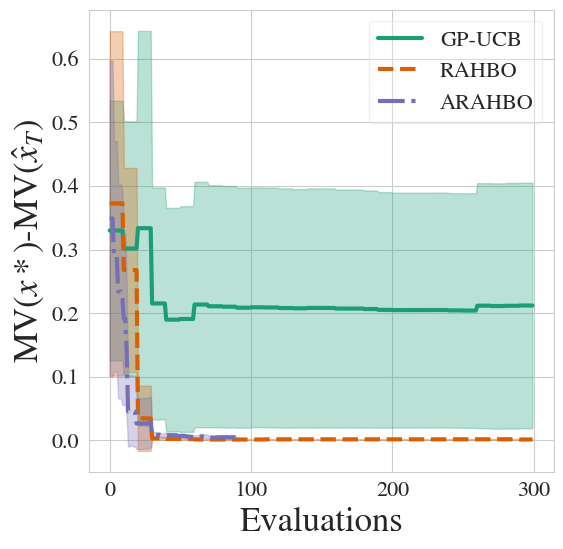

In [ ]:
plot_objectives_mean_std(objectives, objective_name='MV($x*$)-MV($\\hat{x}_T$)', x_label='Evaluations')

### Conclusion

In this notebook, we illustated the behavours differences between heteroscedastic GP-UCB and RAHBO. While GP-UCB might stuck in the area with high noise, that does not happen with RAHBO. Consequently